# High Value Customer Identification (Insiders)

## 0.0. Planejamento da Solução

### Input - Entrada

1. Problema de Negócio
   - Selecionar os clientes mais valiosos para integrar um programa de Fidelização

--------------------------------------------------------------     
2. Conjunto de dados
   - Vendas de um e-commerce online, durante o periodo de um ano.

### Output - Saída

1. A indicação das pessoas que farão parte do programa de Insiders
    - Lista: client_id | is_insider |
    -          10323    | yes / 1
    -          32413    | no / 2

---------------------------------------------------------------
2. Relatório com as respostas das perguntas de negócio
    - Quem são as pessoas elegíveis para participar do programa de Insiders?
    - Quantos clientes farão parte do grupo?
    - Quais as principais características desses clientes?
    - Qual a porcentagem de contribuição do faturamento, vinda do Insiders?
    - Qual a expectativa de faturamento desse grupo para os próximos meses?
    - Quais as condições para uma pessoa ser elegível ao Insiders?
    - Quais as condições para uma pessoa ser removida do Insiders?
    - Qual a garantia que o programa Insiders é melhor que o restante da base?
    - Quais ações o time de marketing pode realizar para aumentar o faturamento?

### Task - Tarefas

1. Quem são as pessoas elegíveis para participar do programa de Insiders?
    - O que é ser elegível? O que são clientes de maior 'valor'?
        - Faturamento:
          - Alto Ticket médio.
          - Alto LTV.
          - Baixo Recência. (Sempre esta comprando ou utilizando o produto)
          - Alto Basket Size.
          - Baixo probabilidade de Churn.
          - Alta previsão de LTV.
          - Alta propensão de compra.

        - Custo:
          - Baixa taxa de devolução.

        - Experiência de compra:
          - Média alta das avaliação.

------------------------------------------------------
2. Quantos clientes farão parte do grupo?
    - Número total de clientes.
    - % do grupo Insiders.

------------------------------------------------------
3. Quais as principais características desses clientes?
    - Escrever características do cliente:
        - Idade.
        - Localização.
        - Sexo.
        - Estado Cívil.

    - Escrever características do consumo:
        - Atributos da clusterização.

------------------------------------------------------
4. Qual a porcentagem de contribuição do faturamento, vinda do Insiders?
    - Faturamento total do ano.
    - Faturamento do grupo Insiders.

------------------------------------------------------
5. Qual a expectativa de faturamento desse grupo para os próximos meses?
    - LTV do grupo Insiders.
    - Análise de Cohort

------------------------------------------------------
6. Quais as condições para uma pessoa ser elegível ao Insiders?
    - Definir a periodicidade. 
    - A pessoa precisa ser similar ou parecido com uma pessoa do grupo.

------------------------------------------------------
7. Quais as condições para uma pessoa ser removida do Insiders?
    - Definir a periodicidade.
    - A pessoa precisa ser desimilar ou não-parecido com uma pessoa do grupo

------------------------------------------------------
8. Qual a garantia que o programa Insiders é melhor que o restante da base?
    - Teste A/B.
    - Teste A/B Bayesiano
    - Teste de hipóteses.

------------------------------------------------------
9. Quais ações o time de marketing pode realizar para aumentar o faturamento?
    - Desconto.
    - Preferência de compra.
    - Produtos exclusivos.
    - Visita a empresa.

# <font color='blue'>0.0. Imports</font>

In [56]:
import numpy    as np
import pandas   as pd
import seaborn  as sns
import inflection
import warnings

import umap.umap_ as umap

from matplotlib import pyplot as plt
from IPython.display import HTML
from plotly import express as px

from sklearn import cluster as c
from sklearn import metrics as m

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

warnings.filterwarnings( 'ignore' )

## <font color='blue'>0.1. Helper Functions</font>

In [2]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'ggplot')
    plt.rcParams['figure.figsize'] = [24, 9]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
    
jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## <font color='blue'>0.2. Load DataSet</font>

In [3]:
# load data
df_raw = pd.read_csv('../data/raw/Ecommerce.csv', encoding='unicode_escape')

# drop extra column
df_raw = df_raw.drop( columns=['Unnamed: 8'], axis=1)

In [4]:
df_raw.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


# <font color='red'>1.0. Descrição dos dados</font>

In [5]:
df1 = df_raw.copy()

## 1.1. Rename Columns

In [6]:
df1.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [7]:
cols_old = ['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country']

snakecase = lambda x: inflection.underscore( x )

cols_new = list( map (snakecase, cols_old) )

#Rename
df1.columns = cols_new

In [8]:
df1.columns

Index(['invoice_no', 'stock_code', 'description', 'quantity', 'invoice_date',
       'unit_price', 'customer_id', 'country'],
      dtype='object')

## 1.2. Data Dimensions

In [9]:
print(f'Numero de Linhas: {df1.shape[0]}')
print(f'Numero de Colunas: {df1.shape[1]}')

Numero de Linhas: 541909
Numero de Colunas: 8


## 1.3. Data Types

In [10]:
df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


In [11]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
dtype: object

## 1.4. Check NA

In [12]:
df1.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

## 1.5. Replace NA

In [13]:
# remove NA
df1 = df1.dropna( subset=['description', 'customer_id'] )
print( f'Removed data: { 1 - (df1.shape[0] / df_raw.shape[0]):.2f}' )

Removed data: 0.25


In [14]:
df1.isna().sum()

invoice_no      0
stock_code      0
description     0
quantity        0
invoice_date    0
unit_price      0
customer_id     0
country         0
dtype: int64

## 1.6. Change Dtypes

In [15]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
dtype: object

In [16]:
# invoice_date
df1['invoice_date'] = pd.to_datetime( df1['invoice_date'], format='%d-%b-%y' )

# customer_id
df1['customer_id'] =df1['customer_id'].astype( int ) 

df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom


In [17]:
df1.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
customer_id              int64
country                 object
dtype: object

## 1.7. Descriptive Statistics

# <font color='red'>2.0. Feature Engineering</font>

In [40]:
df2 = df1.copy()

## 2.1. Feature Creation

In [41]:
df2.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom


In [42]:
# data reference
df_ref = df2.drop( ['invoice_no', 'stock_code', 'description', 
                    'quantity', 'invoice_date', 'unit_price', 
                    'country'], axis=1 ).drop_duplicates( ignore_index=True)

df_ref.head()

,customer_id
0,17850
1,13047
2,12583
3,13748
4,15100


In [43]:
# Gross Revenue (Faturamento) quantity * price
df2['gross_revenue'] = df2['quantity'] * df2['unit_price']

# Monetary
df_monetary = df2[['customer_id', 'gross_revenue']].groupby('customer_id').sum().reset_index()
df_ref = pd.merge( df_ref, df_monetary, on='customer_id', how='left')

# Recency - ultimo dia de compra
df_recency = df2[['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index()
df_recency['recency_days'] = ( df2['invoice_date'].max() - df_recency['invoice_date'] ).dt.days
df_recency = df_recency[['customer_id', 'recency_days']].copy()
df_ref = pd.merge( df_ref, df_recency, on='customer_id', how='left')

# Frequency
df_freq = df2[['customer_id', 'invoice_no']].drop_duplicates().groupby('customer_id').count().reset_index()
df_ref = pd.merge( df_ref, df_freq, on='customer_id', how='left')

# AVG Ticket
df_avg_ticket = df2[['customer_id', 'gross_revenue']].groupby('customer_id').mean().reset_index().rename( columns={'gross_revenue': 'avg_ticket'})
df_ref = pd.merge( df_ref, df_avg_ticket, on='customer_id', how='left')

df_ref.isna().sum()

In [46]:
df_ref.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket
0,17850,5288.63,302,35,16.950737
1,13047,3079.10,31,18,15.709694
2,12583,7187.34,2,18,28.634821
3,13748,948.25,95,5,33.866071
4,15100,635.10,330,6,105.850000


# <font color='red'>3.0. Filtragem de Variáveis</font>

In [47]:
df3 = df_ref.copy()

# <font color='red'>4.0. EDA (Exploratory Data Analysis)</font>

In [48]:
df4 = df3.copy()

# <font color='red'>5.0. Data Preparation</font>

In [49]:
df5 = df4.copy()

# <font color='red'>6.0. Feature Selection</font>

In [50]:
df6 = df5.copy()

# <font color='red'>7.0. Hyperparameter Fine-Tunning</font>

In [51]:
X = df6.drop( columns=['customer_id'])

In [52]:
clusters = [2, 3, 4, 5, 6, 7]

## 7.1. Within-Cluster Sum of Square (WSS)

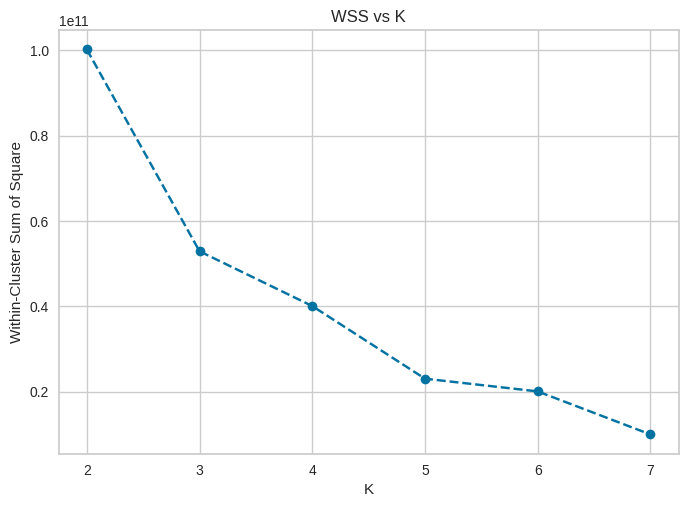

In [53]:
wss = []
for k in clusters:
    # model definition
    kmeans = c.KMeans( init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42 )
    
    # model training
    kmeans.fit( X )
    
    # validation
    wss.append( kmeans.inertia_ )

# plot wss - Elbow Method
plt.plot( clusters, wss, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Within-Cluster Sum of Square' );
plt.title( 'WSS vs K' );

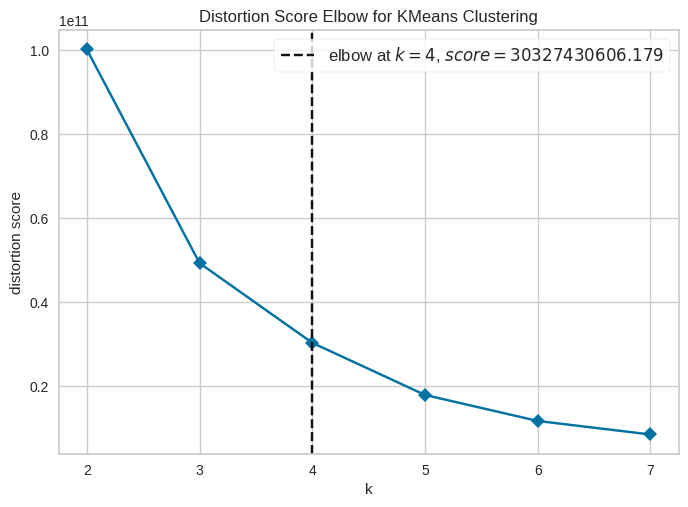

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [54]:
kmeans = KElbowVisualizer( c.KMeans(), k=clusters, timings=False)
kmeans.fit( X )
kmeans.show()

## 7.2. Sillhouette Score

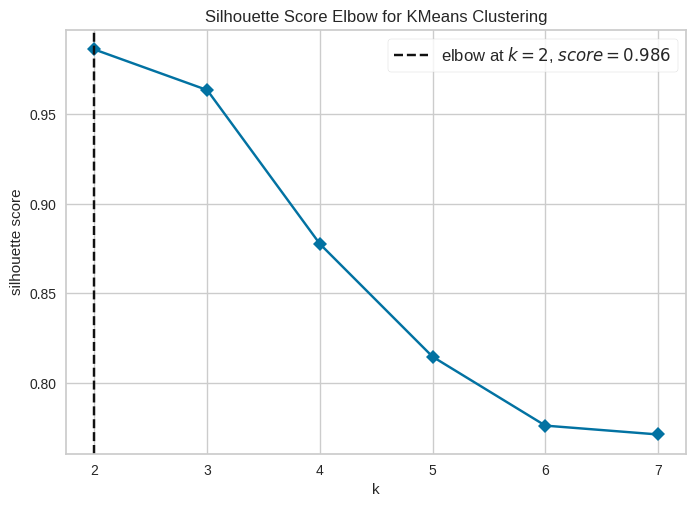

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [55]:
kmeans = KElbowVisualizer( c.KMeans(), k=clusters, metric='silhouette', timings=False)
kmeans.fit( X )
kmeans.show()

### 7.2.1. Sillhouette Analysis

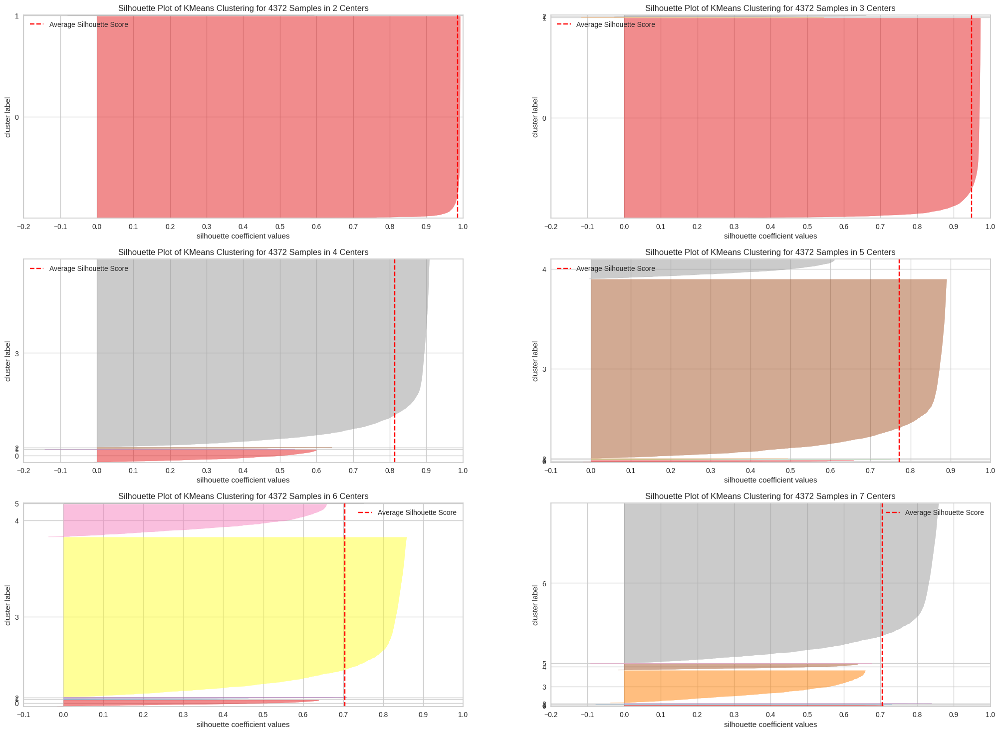

In [62]:
fig, ax = plt.subplots(3, 2, figsize=(25, 18) )

for k in clusters:
    km = c.KMeans( n_clusters=k, init='random', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod( k, 2)
    visualizer = SilhouetteVisualizer( km, color='yellowbrik', ax=ax[q-1][mod] )
    visualizer.fit( X );
    visualizer.finalize()

# <font color='red'>8.0. Model Training</font>

## 8.1. K-Means

In [72]:
# model definition
k = 4
kmeans = c.KMeans( init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42 )

# model training
kmeans.fit( X )

# clustering
labels = kmeans.labels_

### 8.1.0. Cluster Validation

In [73]:
# WSS (Within-Cluster Sum of Square)
print( f'WSS value: {kmeans.inertia_}')

# SS (Silhouette Score)
print( f'SS value: {m.silhouette_score( X, labels, metric="euclidean" )}' )

WSS value: 40056506734.60243
SS value: 0.8139972028952444


# <font color='red'>9.0. Cluster Analysis</font>

In [74]:
df9 = df6.copy()
df9['cluster'] = labels
df9.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,cluster
0,17850,5288.63,302,35,16.950737,0
1,13047,3079.10,31,18,15.709694,3
2,12583,7187.34,2,18,28.634821,0
3,13748,948.25,95,5,33.866071,3
4,15100,635.10,330,6,105.850000,3


## 9.1. Visualization Inspection

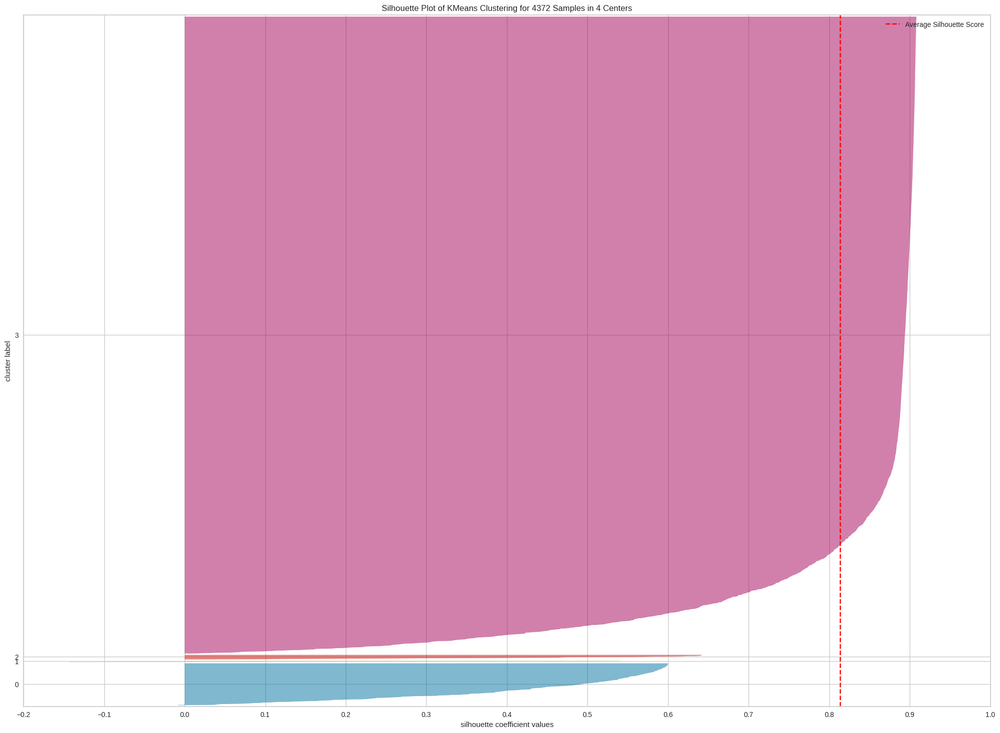

In [75]:
visualizer = SilhouetteVisualizer( kmeans, colors='yellowbrick' )
visualizer.fit( X )
visualizer.finalize()

### 9.1.1 2d plot

In [76]:
df9.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,cluster
0,17850,5288.63,302,35,16.950737,0
1,13047,3079.10,31,18,15.709694,3
2,12583,7187.34,2,18,28.634821,0
3,13748,948.25,95,5,33.866071,3
4,15100,635.10,330,6,105.850000,3


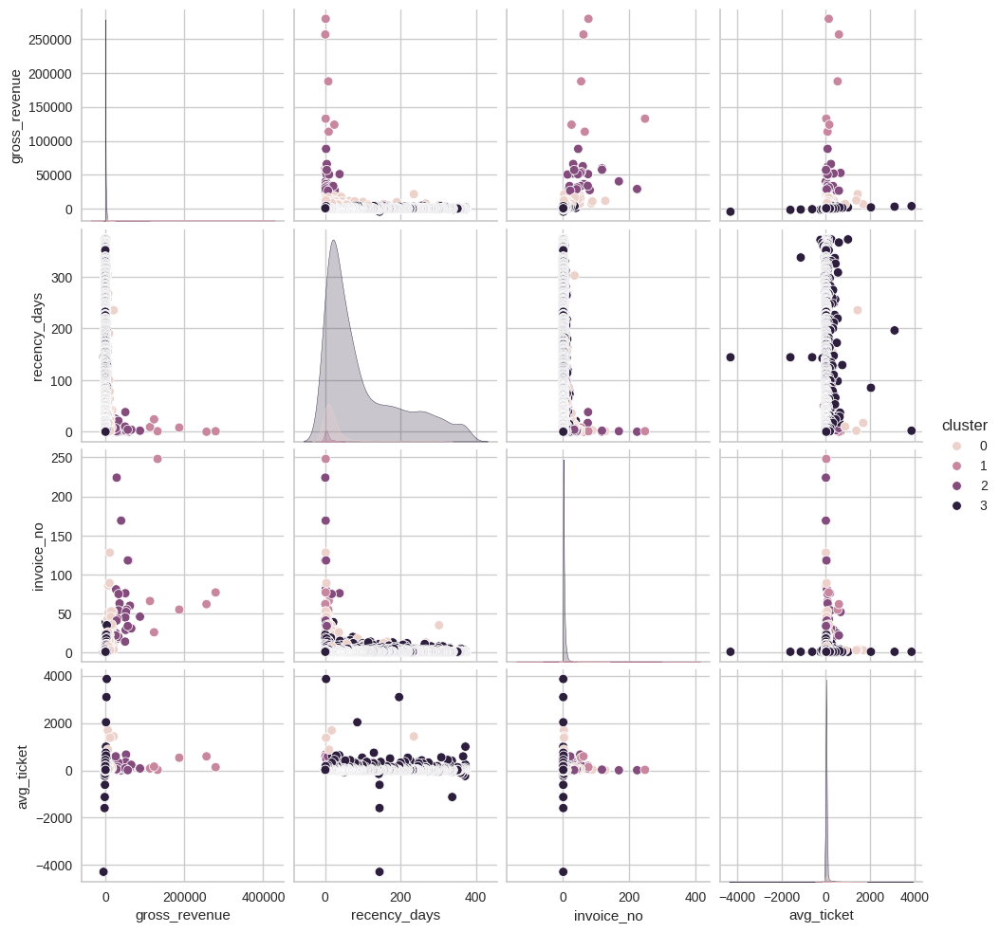

In [77]:
df_viz = df9.drop( columns='customer_id', axis=1 )
sns.pairplot( df_viz, hue='cluster' )

### 9.1.2 UMAP

<Axes: xlabel='embedding_x', ylabel='embedding_y'>

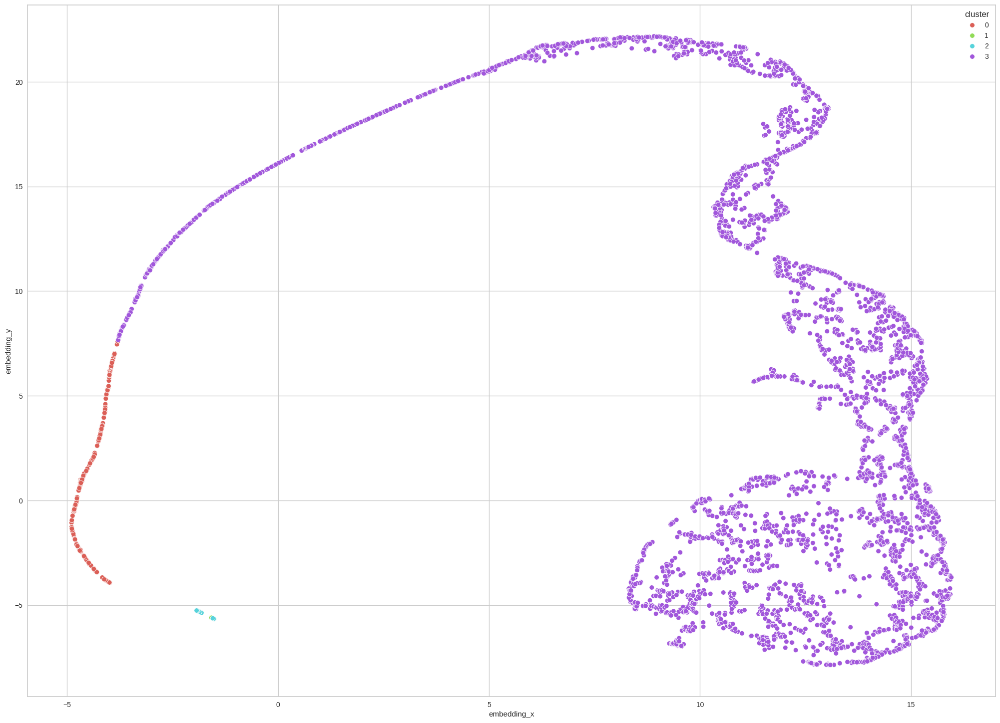

In [83]:
reducer = umap.UMAP( n_neighbors=20, random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_viz['embedding_x'] = embedding[:, 0]
df_viz['embedding_y'] = embedding[:, 1]

#plot
sns.scatterplot( x='embedding_x', y='embedding_y',
               hue='cluster', palette=sns.color_palette( 'hls', n_colors=len(df_viz['cluster'].unique()) ),
               data=df_viz)

## 9.1. Visualization Inspection

In [36]:
# Visualização para até 3 dimenções
#fig = px.scatter_3d( df9, x='recency_days', y='invoice_no', z='gross_revenue', color='cluster' )
#fig.show()

## 9.2. Cluster Profile

In [84]:
df9.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,cluster
0,17850,5288.63,302,35,16.950737,0
1,13047,3079.10,31,18,15.709694,3
2,12583,7187.34,2,18,28.634821,0
3,13748,948.25,95,5,33.866071,3
4,15100,635.10,330,6,105.850000,3


In [85]:
# Number of customer
df_cluster = df9[['customer_id', 'cluster']].groupby( 'cluster' ).count().reset_index()
df_cluster['perc_customer'] = 100 * ( df_cluster['customer_id'] / df_cluster['customer_id'].sum() )

# AVG gross_revenue
df_avg_gross_revenue = df9[['gross_revenue', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_gross_revenue, how='inner', on='cluster')

# AVG recency_days
df_avg_recency_days = df9[['recency_days', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_recency_days, how='inner', on='cluster')

# AVG invoice_no
df_avg_invoice_no = df9[['invoice_no', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_invoice_no, how='inner', on='cluster')

# Avg Ticket
df_tcket = df9[['avg_ticket', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_tcket, how='inner', on='cluster')

df_cluster

,cluster,customer_id,perc_customer,gross_revenue,recency_days,invoice_no,avg_ticket
0,0,267,6.107045,8089.028652,20.280899,19.528090,62.783157
1,1,6,0.137237,182181.981667,7.166667,89.000000,253.626345
2,2,28,0.640439,42614.387143,6.178571,57.821429,162.862605
3,3,4071,93.115279,946.696250,96.969295,3.641120,25.359654


### Cluster 01:
    - Número de customers: 6 (0,14% do custormers)
    - Recência em média: 7 dias
    - Compra em média: 89 compras
    - Ticket em média: $253,63 dolares
- Receita em média: $182.181,98 dolares

### Cluster 02:
    - Número de customers: 28 (0,64% do custormers)
    - Recência em média: 6 dias
    - Compra em média: 58 compras
    - Ticket em média: $162,86 dolares
- Receita em média: $42.614,39 dolares

### Cluster 03:
    - Número de customers: 267 (6% do custormers)
    - Recência em média: 20 dias
    - Compra em média: 19 compras
    - Ticket em média: $62,78 dolares
- Receita em média: $8.089,03 dolares

### Cluster 04:
    - Número de customers: 4.071 (93% do custormers)
    - Recência em média: 96 dias
    - Compra em média: 3 compras
    - Ticket em média: $25,36 dolares
- Receita em média: $946,70 dolares

# <font color='red'>10.0. Deploy To Production</font>